In [2]:
from comet_ml import ExistingExperiment, Experiment

experiment = Experiment(project_name='first_try')

COMET INFO: old comet version (2.0.7) detected. current: 2.0.9 please update your comet lib with command: `pip install --no-cache-dir --upgrade comet_ml`
COMET INFO: Experiment is live on comet.ml https://www.comet.ml/augustc/first-try/a0f4bc316df046a29e85dd776b75a925



# SConvNet + Discriminator

The idea is to train SConvNet with pairs $(X,y)$ where $X$ is a large patch and $y$ a smaller one within $X$. After that, training is made like an adversarial framework with a discriminator $D$ that classifies patch $y$ into real or not (in other words, $D$ is trained with real images to understand the structures of the dataset and then classifies the patches from SConvNet into structures that are similar or not to the real ones).

In [ ]:
l_patch = 35
s_patch = 7
batch_norm = True
epochs = 51

params = {'Large_patch': l_patch, 
          'Small_patch': s_patch, 
          'Batch_norm': batch_norm,
          'Epochs': epochs}
experiment.log_parameters(params)

### Generator

In [ ]:
from networks.models import SConvNet

gen_nn = SConvNet(l_patch - s_patch + 1, model_name='SConvNetGAN', batch_norm=batch_norm)
gen_nn.summary()

### Discriminator

In [ ]:
from networks.models import Discriminator

disc_nn = Discriminator(l_patch, s_patch)
disc_nn.summary()

In [17]:
# If restarting training

from keras.models import load_model

gen_nn = load_model('pretrained_models/G.h5')
disc_nn = load_model('pretrained_models/D.h5')

/home/augustocms/anaconda3/lib/python3.6/site-packages/keras/models.py:318: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


### DCGAN

In [18]:
from networks.models import DCGAN

disc_nn.trainable = False

dcgan_nn = DCGAN(l_patch, s_patch, G=gen_nn, D=disc_nn)
dcgan_nn.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
SConvNetGAN (Model)             (None, None, None, 2 346818      input_2[0][0]                    
__________________________________________________________________________________________________
D (Model)                       (None, None, None, 2 20354       input_2[0][0]                    
                                                                 SConvNetGAN[1][0]                
Total params: 367,172
Trainable params: 345,602
Non-trainable params: 21,570
__________________________________________________________________________________________________


/home/augustocms/Masters/studies/notebooks/Image-to-Image-Transformation-Learning/networks/models.py:115: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., name="DCGAN", outputs=[<tf.Tenso...)`
  DCGAN = Model(inputs=inp_g, output=[gen_img, d_out], name='DCGAN')


In [19]:
from keras.optimizers import Adam

lr_dcg = 0.0004
lr_dsc = 0.0001

opt_dcg = Adam(lr=lr_dcg)
opt_disc = Adam(lr=lr_dsc)

loss_gen = 'binary_crossentropy'
loss_dcgan = 'binary_crossentropy'
loss_disc = 'binary_crossentropy'

gen_nn.compile(optimizer=opt_disc, loss=loss_gen)
dcgan_nn.compile(optimizer=opt_dcg, loss=loss_dcgan)

disc_nn.trainable = True
disc_nn.compile(optimizer=opt_disc, loss=loss_disc)

params = {'dsc_lr': lr_dsc,
        'adv_lr': lr_dcg}
experiment.log_parameters(params)

NameError: name 'experiment' is not defined

## DRIVE
### Loading data

In [20]:
import numpy as np

# Directories of images and ground truth
dir_drive = "/home/augustocms/datasets/drive/training/"
dir_img = dir_drive + "images/"
dir_seg = dir_drive + "1st_manual/"
dir_test = "/home/augustocms/datasets/drive/test/"
dir_test_img = dir_test + "images/"
dir_test_seg = dir_test + "1st_manual/"
dir_mask = dir_drive + "mask/"

with open(dir_drive + 'train.txt') as f:
    x = f.read().splitlines()
imgs = np.array(x)

with open(dir_drive + 'val.txt') as f:
    x = f.read().splitlines()
val_imgs = np.array(x)

with open(dir_test + 'test.txt') as f:
    x = f.read().splitlines()
test_imgs = np.array(x)

print(imgs[0])

21_training.tif 21_manual1.gif 21_training_mask.gif


## Load Data

Viewing the data and adjusting lists for DataGen

In [ ]:
import scipy.misc as m
import matplotlib.pyplot as plt

images, gt, mask = [], [], []
tl_img, tl_gt, tl_mask = [],[],[]

for line in imgs:
    names = line.split()
    img = m.imread(dir_img + names[0])
    seg = m.imread(dir_seg + names[1])
    maskim = m.imread(dir_mask + names[2])
    
    tl_img.append(names[0])
    tl_gt.append(names[1])
    tl_mask.append(names[2])
    
    fig = plt.figure(figsize=(20,40))
    ax = fig.add_subplot(1,3,1)
    ax.imshow(img)
    ax.set_title("Original Image")

    ax = fig.add_subplot(1,3,2)
    ax.imshow(seg, cmap='gray')
    ax.set_title('Ground Truth')
    
    ax = fig.add_subplot(1,3,3)
    ax.imshow(maskim, cmap='gray')
    ax.set_title('Mask')
    
    plt.show()

Adjusting lists of validation data for the specified format of DataGen

In [ ]:
vl_img, vl_gt, vl_mask = [], [], []
for line in val_imgs:
    names = line.split()
    vl_img.append(names[0])
    vl_gt.append(names[1])
    vl_mask.append(names[2])

In [ ]:
from utils.datagen import DataGenPatches

# Dicts for DataGen
paths_to_files = {'images': dir_img, 'gt': dir_seg, 'mask': dir_mask}
tdata_lists = {'images': tl_img, 'gt':tl_gt, 'mask':tl_mask}
vdata_lists = {'images': vl_img, 'gt':vl_gt, 'mask':vl_mask}

batch_size = 256

# DataGen
tDataGenP = DataGenPatches(l_patch, s_patch, data_lists=tdata_lists, paths=paths_to_files, window=29, load_all=False, batch_size=256, imsize=(584, 565))
# vDataGenP = DataGenPatches(l_patch, s_patch, data_lists=vdata_lists, paths=paths_to_files, window=29, load_all=False, batch_size=256, imsize=(584, 565))

tDataGenP.__len__()

## Training

In [25]:
import os

# Creating directories for weights and models
if not os.path.exists('weights/'):
    os.makedirs('weights/')
    
if not os.path.exists('pretrained_models/'):
    os.makedirs('pretrained_models/')
    
# if os.path.exists('weights/sgannet_drive.hdf5'):
#     sconv_model.load_weights('sgannet_drive.hdf5')


100%|██████████| 469/469 [02:00<00:00,  3.90it/s, D_loss=0.631, G_loss=0.0535, DCGAN_loss=0.913]


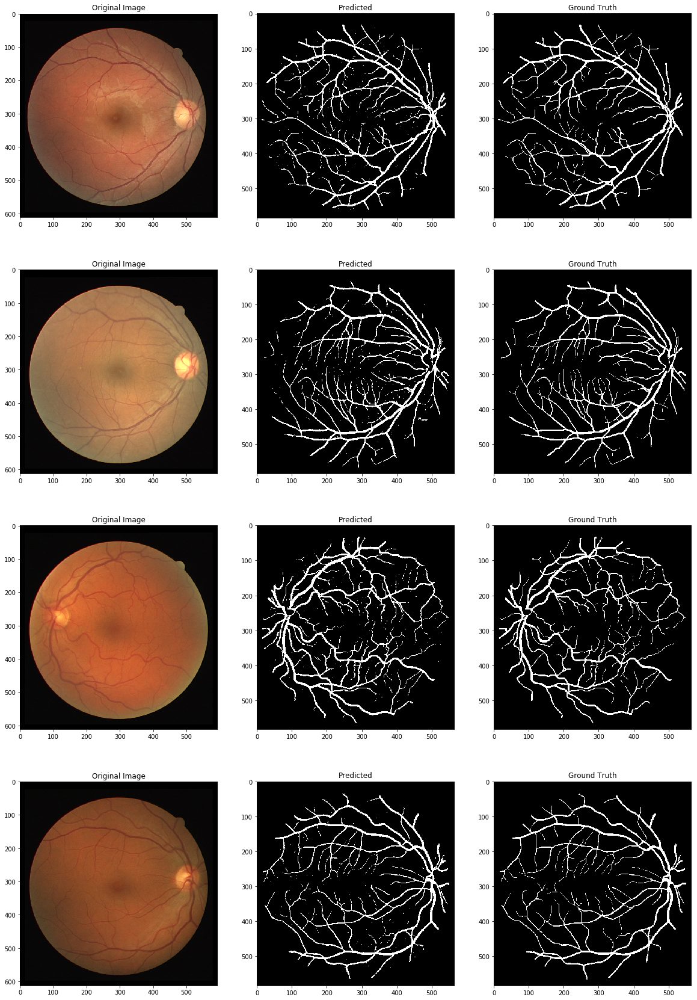

100%|██████████| 469/469 [01:49<00:00,  4.28it/s, D_loss=0.596, G_loss=0.0512, DCGAN_loss=0.954]


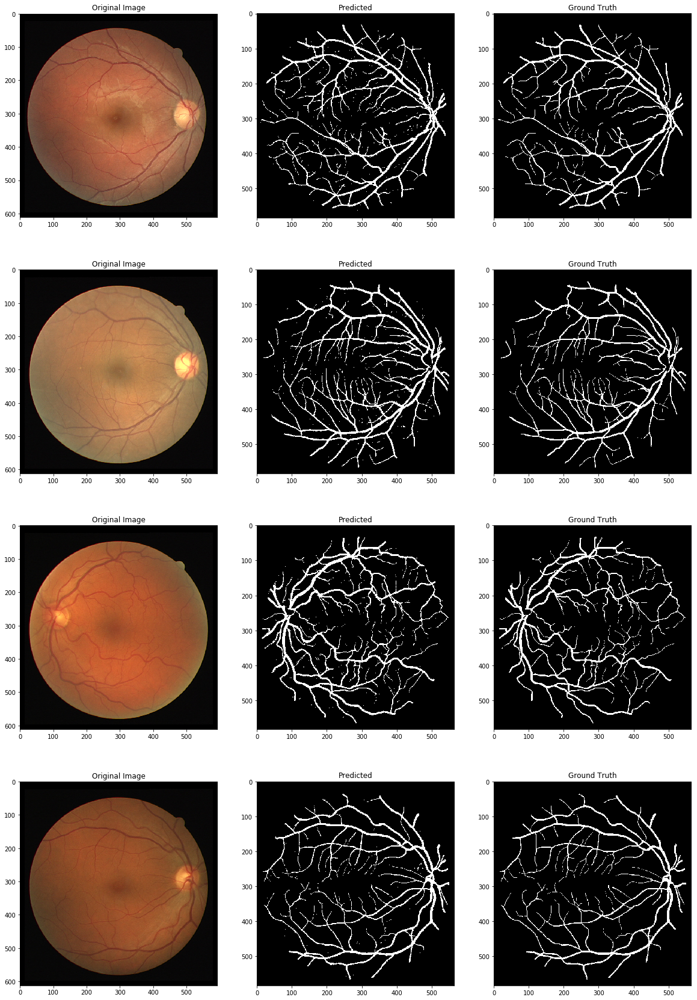

100%|██████████| 469/469 [01:48<00:00,  4.32it/s, D_loss=0.614, G_loss=0.0422, DCGAN_loss=0.954]


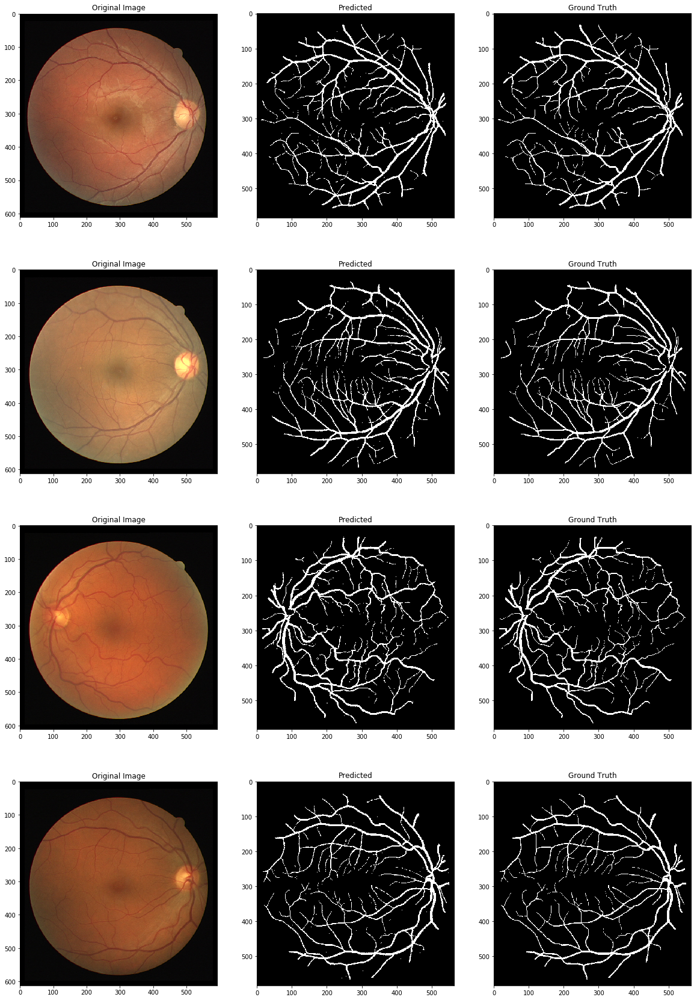

100%|██████████| 469/469 [01:48<00:00,  4.33it/s, D_loss=0.623, G_loss=0.0418, DCGAN_loss=0.961]


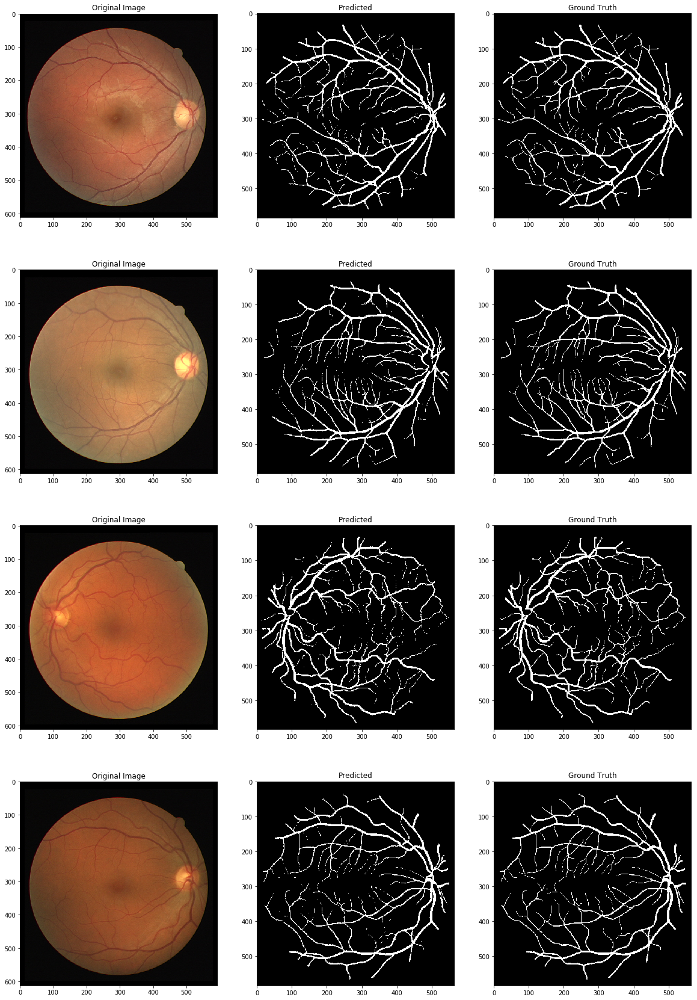

100%|██████████| 469/469 [01:48<00:00,  4.31it/s, D_loss=0.622, G_loss=0.0386, DCGAN_loss=0.908]


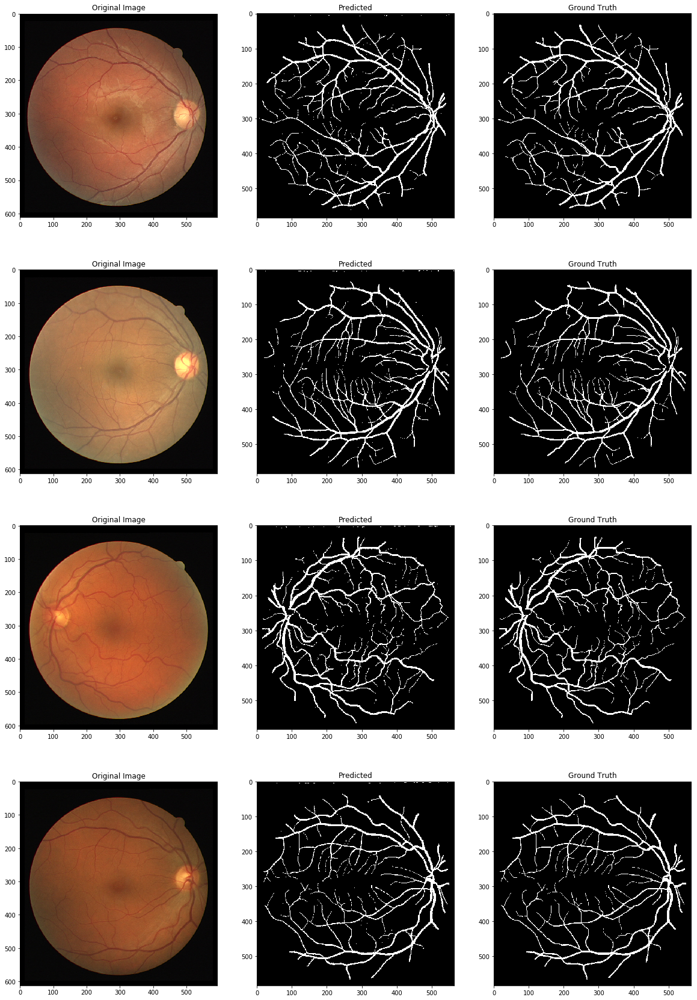

100%|██████████| 469/469 [01:48<00:00,  4.31it/s, D_loss=0.651, G_loss=0.0313, DCGAN_loss=0.934]


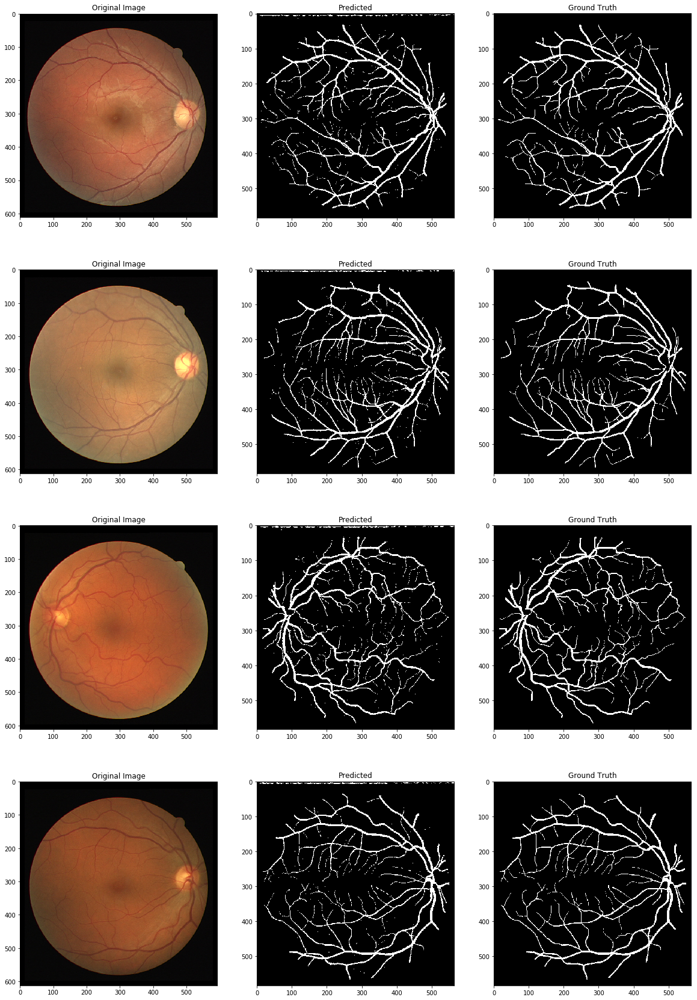

100%|██████████| 469/469 [01:48<00:00,  4.33it/s, D_loss=0.605, G_loss=0.0286, DCGAN_loss=0.921]


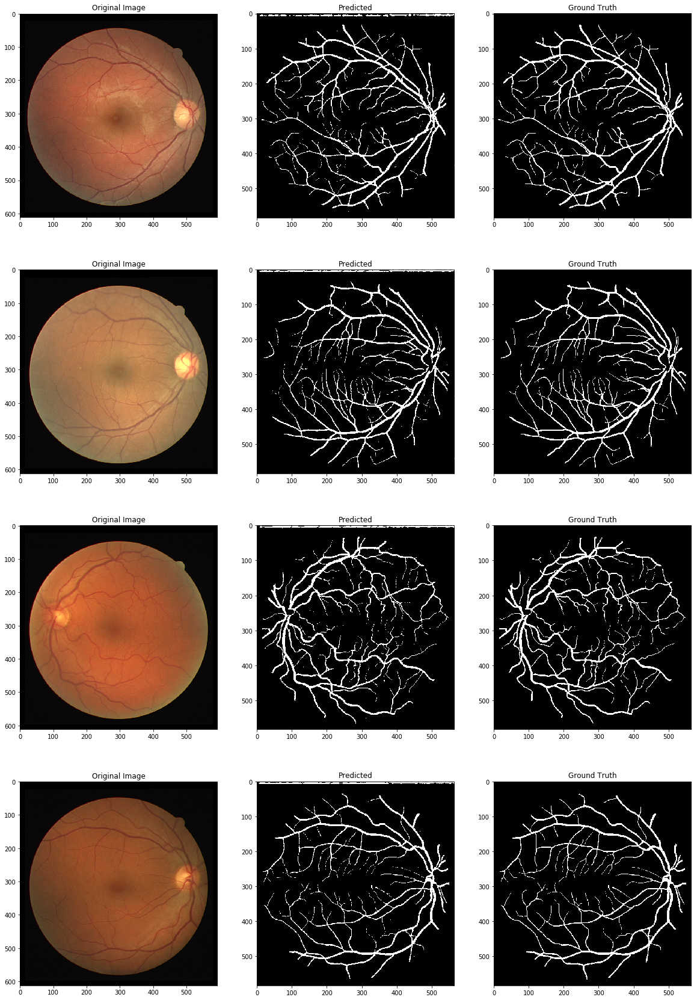

100%|██████████| 469/469 [01:49<00:00,  4.30it/s, D_loss=0.585, G_loss=0.0276, DCGAN_loss=0.916]


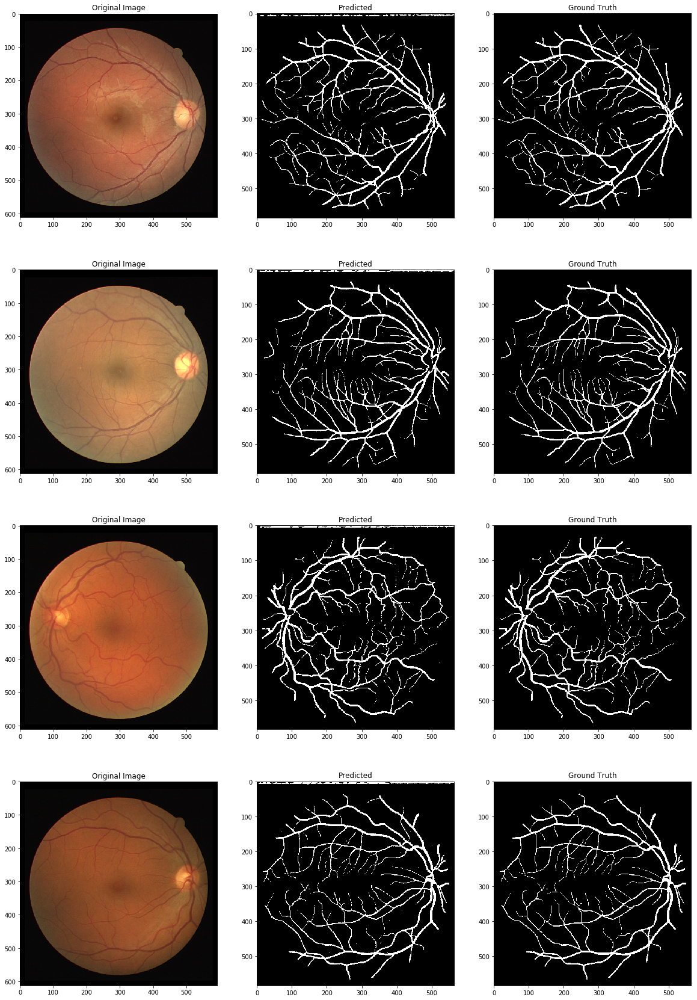

100%|██████████| 469/469 [01:48<00:00,  4.33it/s, D_loss=0.599, G_loss=0.0267, DCGAN_loss=0.923]


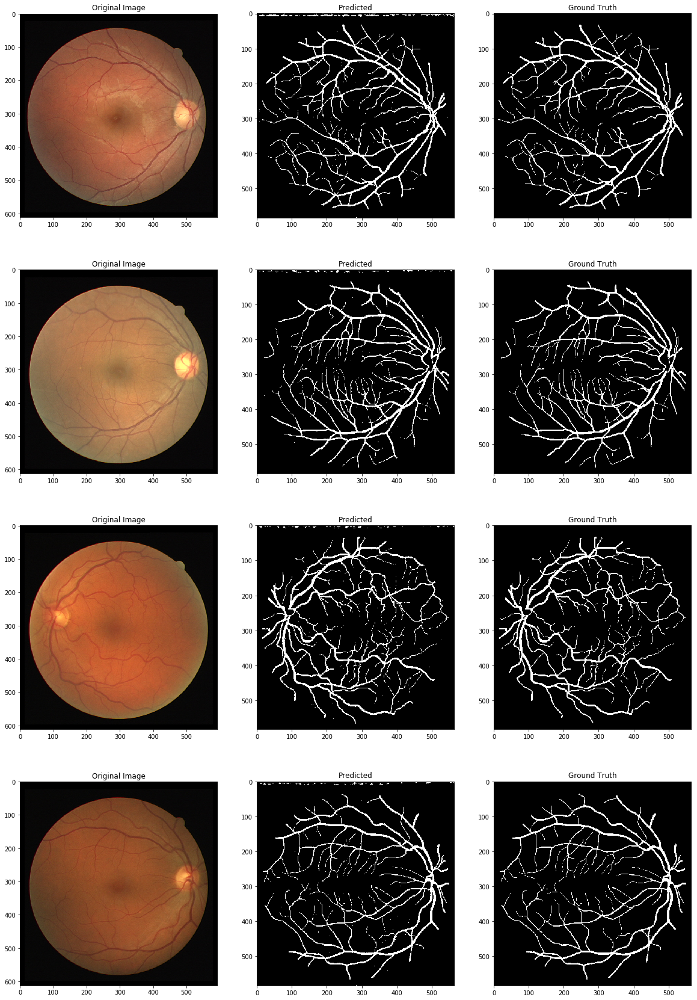

100%|██████████| 469/469 [01:48<00:00,  4.32it/s, D_loss=0.591, G_loss=0.0289, DCGAN_loss=0.951]


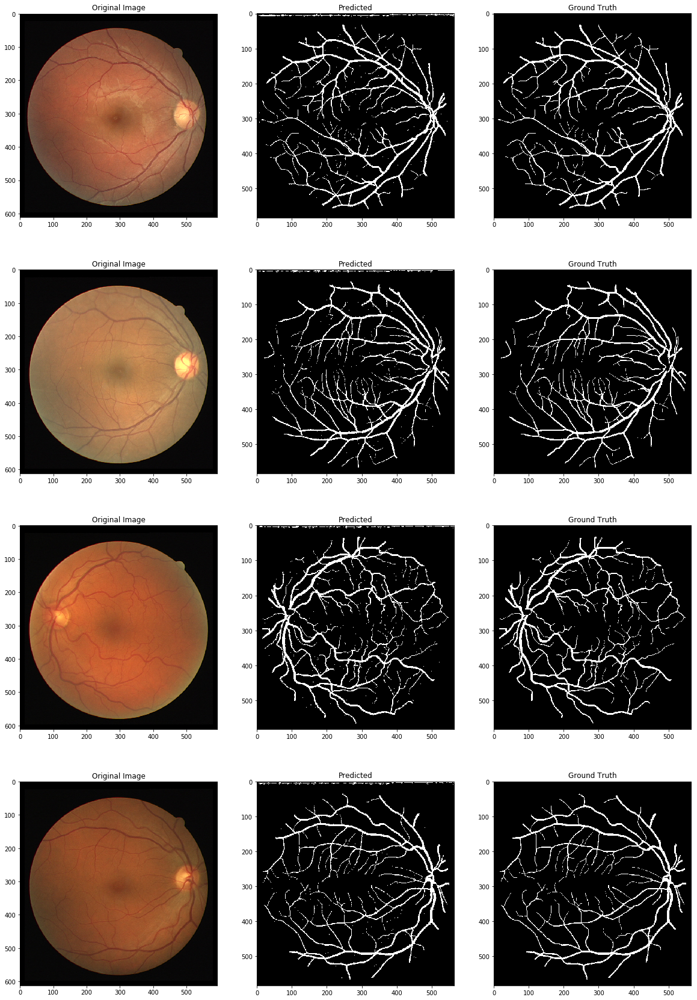

100%|██████████| 469/469 [01:48<00:00,  4.30it/s, D_loss=0.563, G_loss=0.03, DCGAN_loss=0.961]  


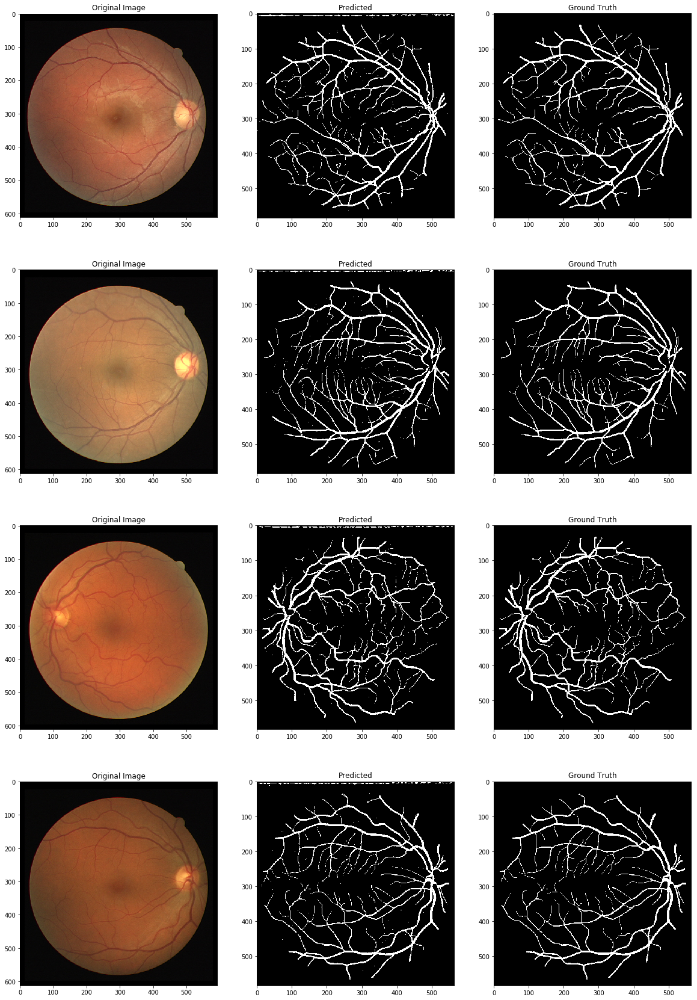

In [31]:
from keras.utils import generic_utils
from utils.image_utils import plot_predicted_images
from utils.evaluation import precision, recall, f1, acc
from tqdm import tqdm

tqdm.monitor_interval = 0  #workaround for tqdm error
step=0
fmeasure_old = -1

for j in range(epochs):
    tDataGenP.on_epoch_end()
    bs = tDataGenP.batch_size
    n_batches = len(tDataGenP)
    t = tqdm(range(n_batches))
    
    dl, gl, dcgl = 0,0,0
    for i in t:
        experiment.set_step(step)
        step = step+1
        
        # Get data from DataGen
        X_orig, y_orig = tDataGenP[i]
        # Create fake data for half of the data
        n = X_orig.shape[0]
        X_toG = X_orig[n//2:]
        y = np.zeros(y_orig.shape)
        y[:n//2] = y_orig[:n//2]
        y_gen = gen_nn.predict(X_toG)
        y[n//2:] = y_gen
        
        # Data for discriminator D
        X_Dtrain = [X_orig,y]
        y_Dtrain = np.zeros((n,1,1,2))
        y_Dtrain[n//2:,:,:, 0] = 1.0
        y_Dtrain[:n//2,:,:, 1] = 0.9
        # Train D
        disc_nn.trainable = True
        D_loss = disc_nn.train_on_batch(X_Dtrain, y_Dtrain)
        
        # Data for generator G
        X_Gtrain = X_orig
        y_Gtrain = np.zeros((n,1,1,2))
        y_Gtrain[:,:,:,1] = 1
        # Freeze D
        disc_nn.trainable = False
        # Train G
        G_loss = dcgan_nn.train_on_batch(X_Gtrain, [y_orig, y_Gtrain])
        t.set_postfix({'D_loss': D_loss, 'G_loss': G_loss[1], 'DCGAN_loss':G_loss[0]})
        
        dl += D_loss
        gl += G_loss[1]
        dcgl += G_loss[0]
        
        with experiment.train():
            if i%50 == 0 and i > 0:
                dl /= len(tDataGenP)
                gl /= len(tDataGenP)
                dcgl /= len(tDataGenP)
                metrics = {'d_loss': dl,
                           'g_loss': gl,
                           'adv_loss': dcgl,}
                experiment.log_metrics(metrics)
            
    if j % 5 == 0:
        with experiment.validate():
            imgs, gt = plot_predicted_images(gen_nn, vdata_lists, paths_to_files, window=l_patch-s_patch+1)
            fmeasure = f1(imgs,gt)
            prec = precision(imgs,gt)
            rec = recall(imgs,gt)

            if fmeasure > fmeasure_old:
                gen_nn.save('pretrained_models/G.h5')
                disc_nn.save('pretrained_models/D.h5')
                dcgan_nn.save('pretrained_models/DCGAN.h5')
                fmeasure_old = fmeasure
                
            metrics = {
                'precision': prec,
                'recall' : rec,
                'F1': fmeasure
            }
            experiment.log_metrics(metrics)
            
            plt.figure(figsize=(10,15))
            for im in range(len(imgs)):
                plt.subplot(2, 2, im+1)
                image = imgs[im, :, :]            
                plt.imshow(image, cmap='gray')
                plt.axis('off')               
            
            plt.tight_layout()
            plt.savefig(r'experiments/drive/'+str(j)+'.png')
            experiment.log_image(r'experiments/drive/'+str(j)+'.png')
            plt.close('all')

In [32]:
# Creating gif of images

import imageio

filenames = [r'experiments/drive/'+str(i)+'.png' for i in range(0,51,5)]
images = []
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave(r'experiments/drive/learning.gif', images, duration=0.5)

experiment.log_image('experiments/drive/learning.gif')

{'web': 'https://www.comet.ml/api/image/download?imageId=33fe86d5397b4b27a4fa15cca4b95fdb&experimentKey=9231f915494649cc9e6e2596c61daaf8',
 'api': 'https://www.comet.ml/api/rest/v1/image/get-image?imageId=33fe86d5397b4b27a4fa15cca4b95fdb&experimentKey=9231f915494649cc9e6e2596c61daaf8'}

In [3]:
experiment.end()

COMET INFO: ----------------------------
COMET INFO: Comet.ml Experiment Summary:
COMET INFO:   Data:
COMET INFO:     url: https://www.comet.ml/augustc/first-try/a0f4bc316df046a29e85dd776b75a925
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     sys.gpu.0.free_memory    : (4238671872.0, 4238671872.0)
COMET INFO:     sys.gpu.0.gpu_utilization: (0.0, 0.0)
COMET INFO:     sys.gpu.0.total_memory   : (4238737408.0, 4238737408.0)
COMET INFO:     sys.gpu.0.used_memory    : (65536.0, 65536.0)
COMET INFO: ----------------------------
COMET INFO: Uploading stats to Comet before program termination (may take several seconds)


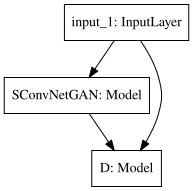

In [12]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(dcgan_nn).create(prog='dot', format='svg'))

# Comparison against SConvNet without an adversarial framework

In [21]:
tl_img, tl_gt, tl_mask, gts = [], [], [], []
for line in test_imgs:
    names = line.split()
    tl_img.append(names[0])
    tl_gt.append(names[1])
    
print(len(tl_img))

20


/home/augustocms/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  del sys.path[0]


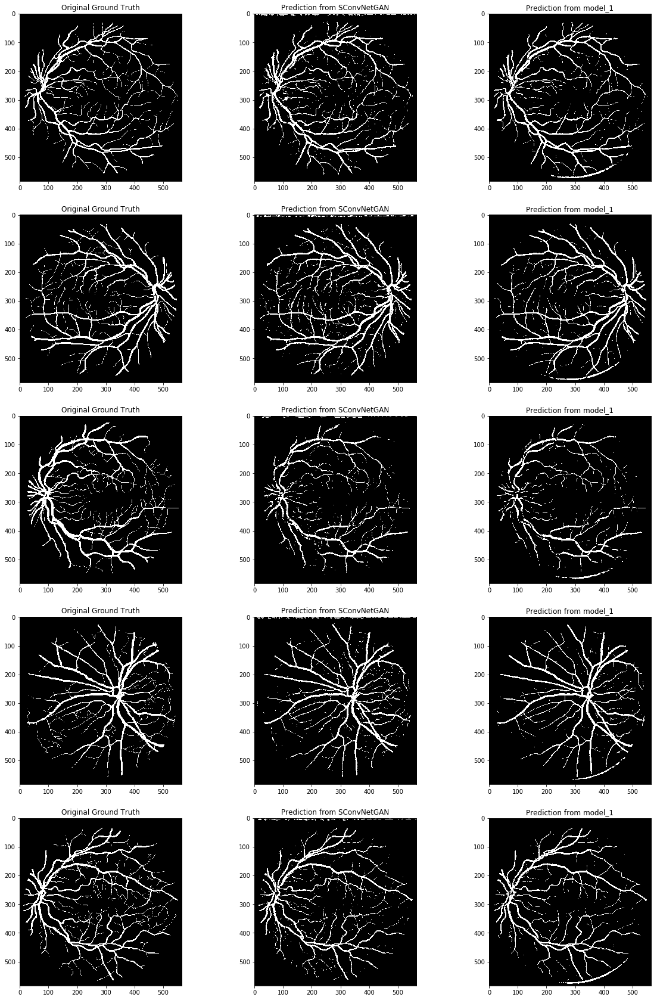

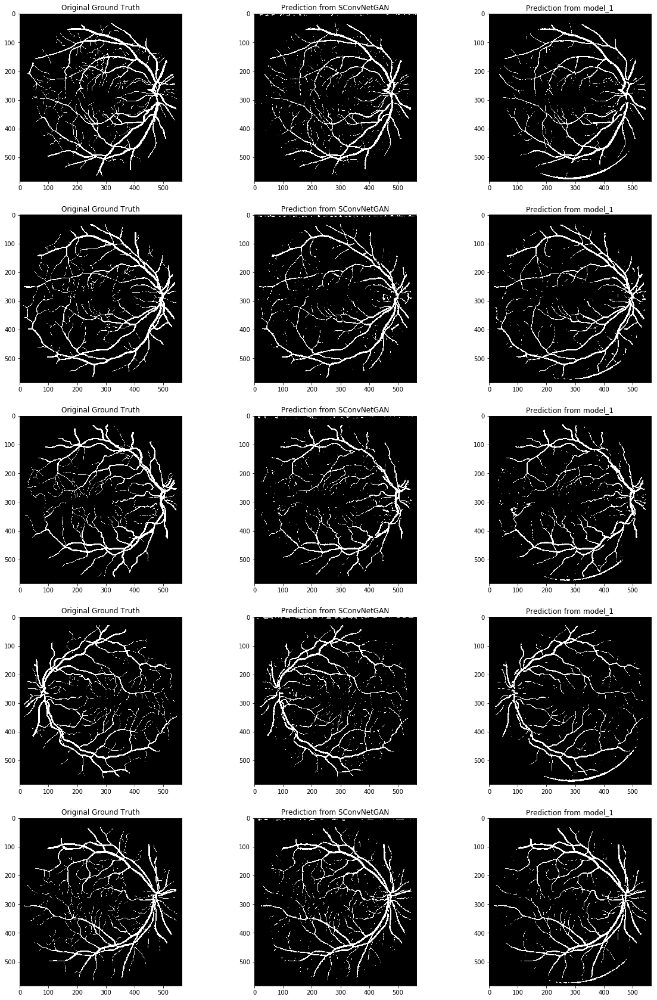

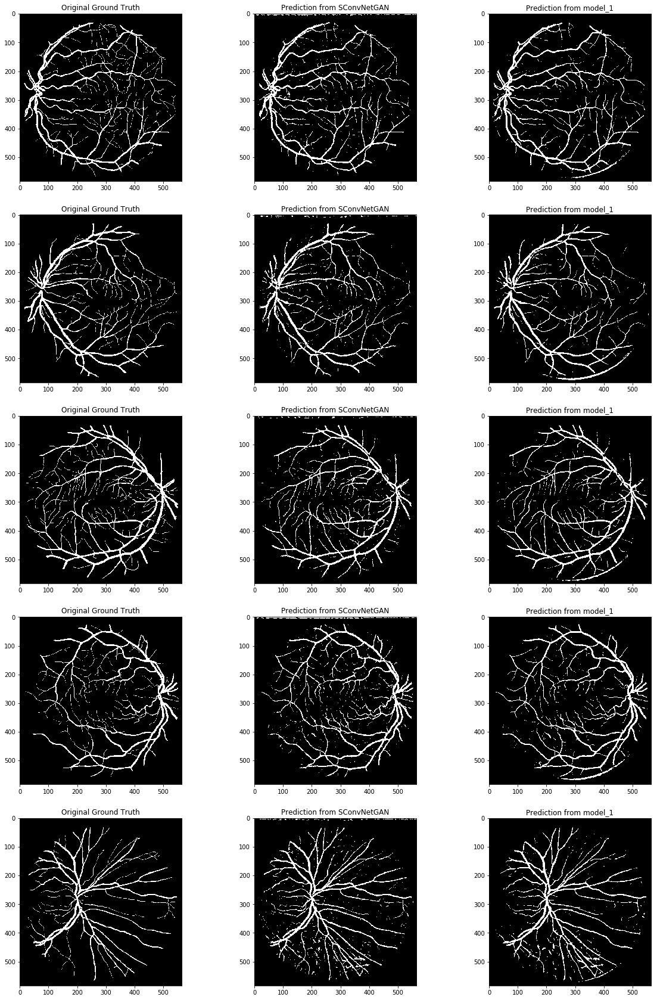

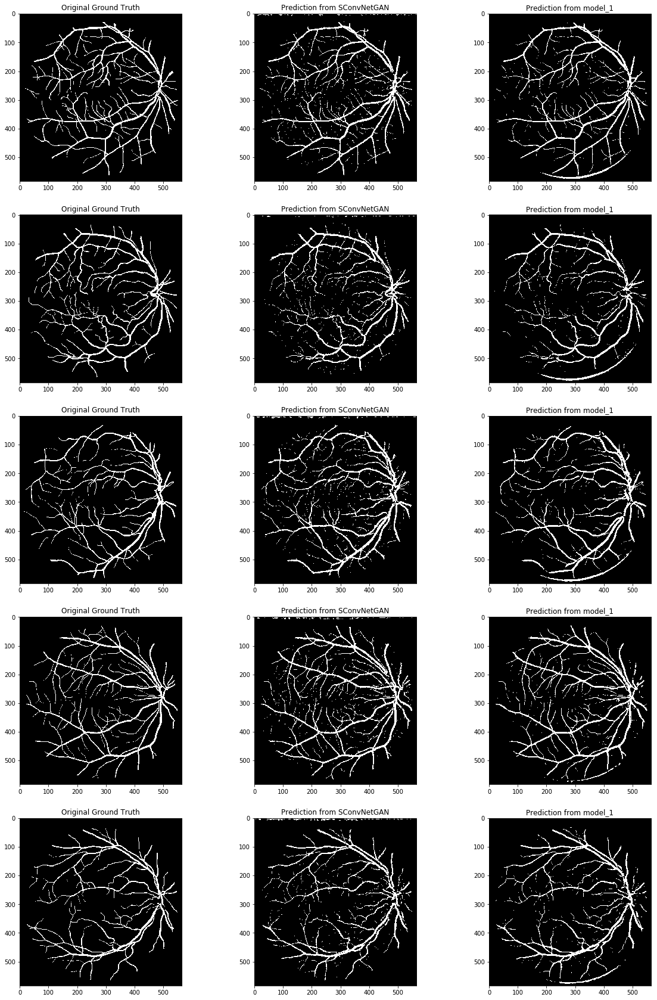

Precision 0.766743527288
Recall 0.755445587383
F1 0.761052629744
Accuracy 0.958455267305
Precision 0.79597892503
Recall 0.752836342559
F1 0.773806760836
Accuracy 0.961454570251


In [24]:
from keras.models import load_model
from utils.image_utils import plot_comparison
import scipy.misc as m
from utils.evaluation import precision, recall, f1, acc

paths_to_files = {'images': dir_test_img, 'gt': dir_test_seg, 'mask': dir_mask}
    
gen_nn = load_model('pretrained_models/G.h5')
sconv_model = load_model('pretrained_models/sconvnet_drive.h5')

gts = []
for i in tl_gt:
    gts.append(m.imread(paths_to_files['gt']+i, mode='L'))
gts = np.asarray(gts)
    
predictionsA, predictionsB = [],[]
for i in range(0,19,5):
    tdata_lists = {'images': tl_img[i:i+5], 'gt':tl_gt[i:i+5], 'mask':None}
    predA, predB = plot_comparison(gen_nn, sconv_model, tdata_lists, paths_to_files, window=l_patch-s_patch+1)
    predictionsA.append(predA)
    predictionsB.append(predB)
    
predictionsA = np.concatenate(predictionsA, axis=0)
predictionsB = np.concatenate(predictionsB, axis=0)
    
print('Precision', precision(predictionsA,gts))
print('Recall', recall(predictionsA,gts))
print('F1', f1(predictionsA,gts))
print('Accuracy', acc(predictionsA,gts))
        
print('Precision', precision(predictionsB,gts))
print('Recall', recall(predictionsB,gts))
print('F1', f1(predictionsB,gts))
print('Accuracy', acc(predictionsB,gts))

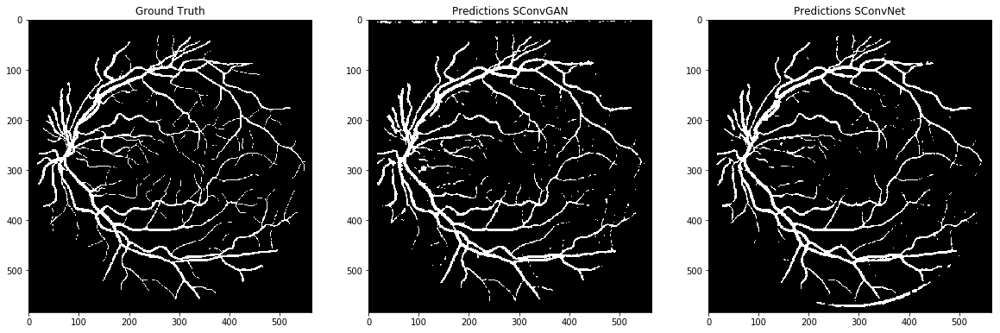

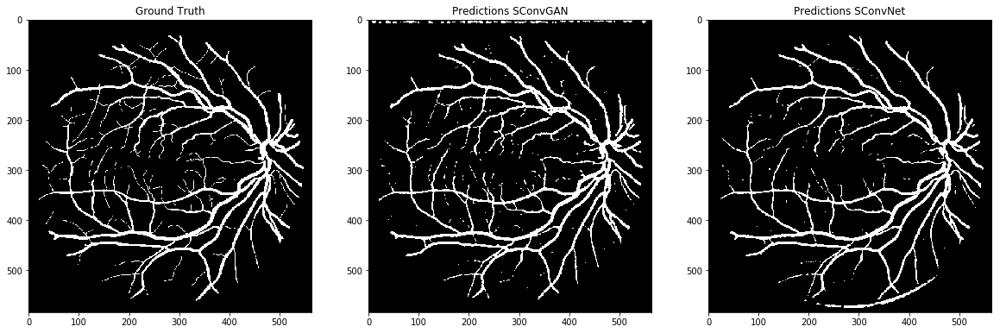

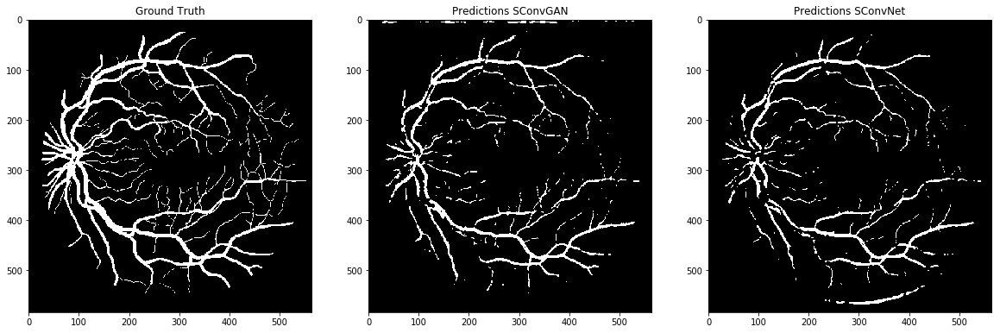

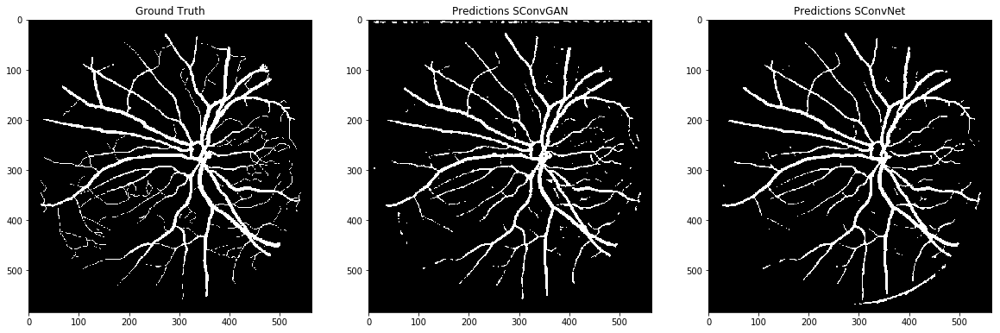

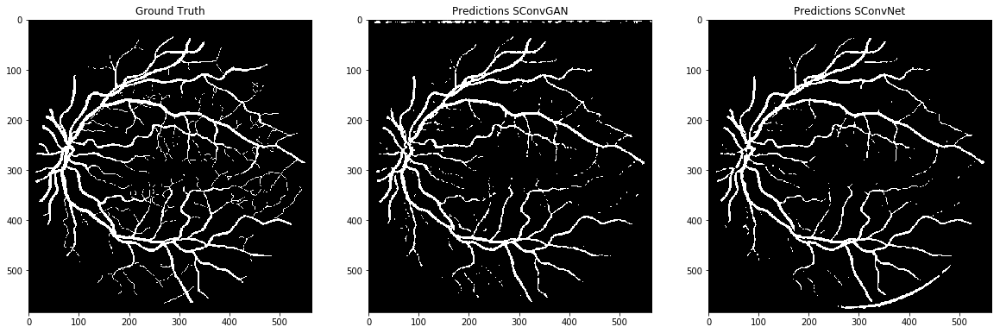

...

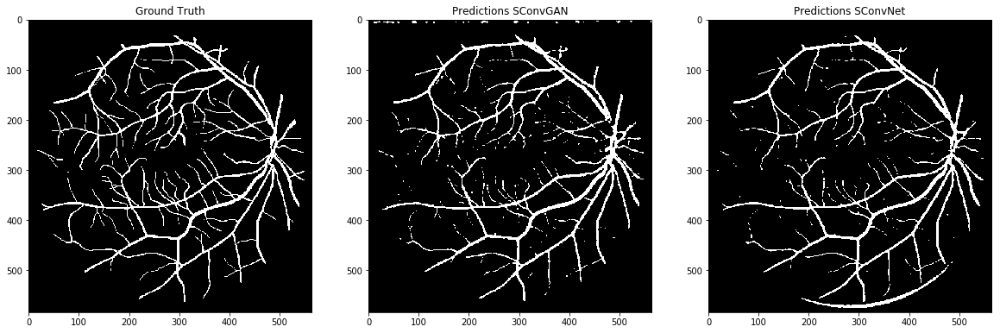

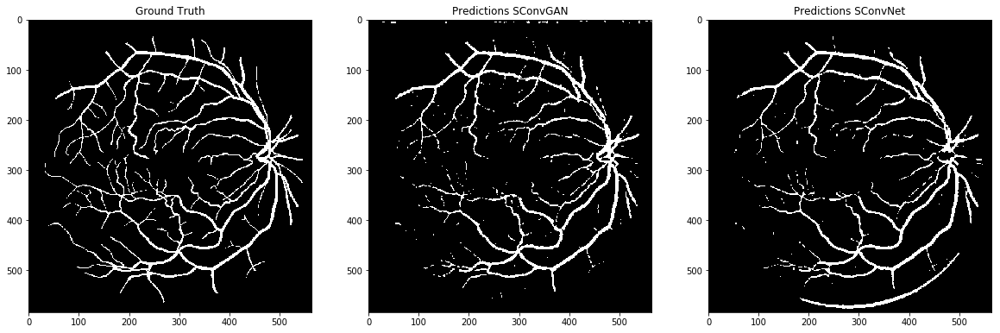

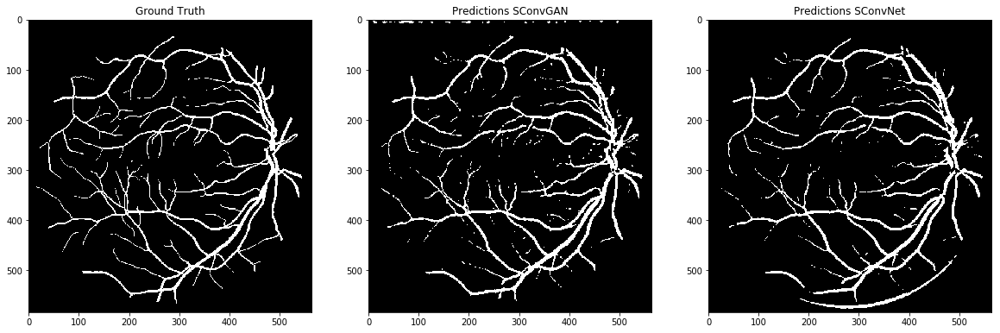

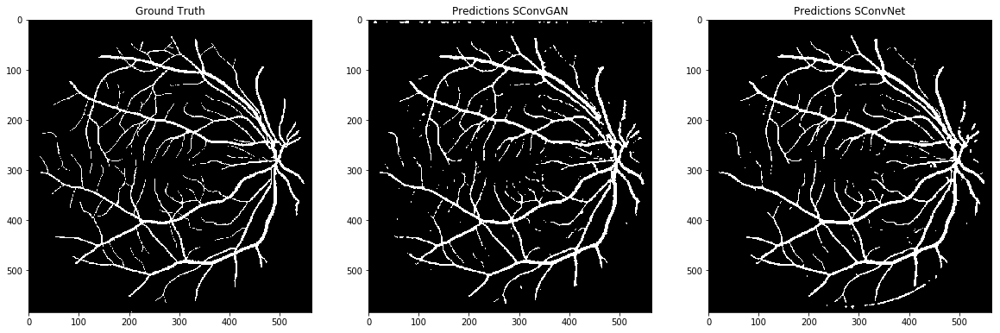

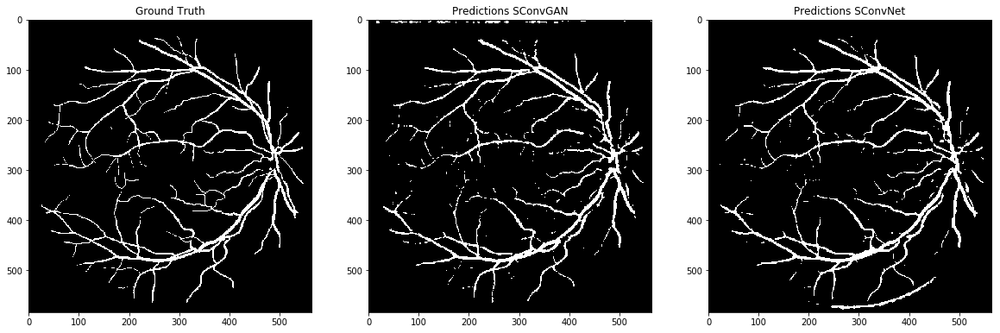

In [36]:
from scipy import ndimage
import matplotlib.pyplot as plt

for i,ing in enumerate(predictionsA):
    predA = ndimage.median_filter(ing, 3)
    predB = ndimage.median_filter(predictionsB[i], 3)

    fig = plt.figure(figsize=(20,40))
    ax = fig.add_subplot(1,3,1)
    ax.imshow(gts[i], cmap='gray')
    ax.set_title("Ground Truth")

    ax = fig.add_subplot(1,3,2)
    ax.imshow(predA, cmap='gray')
    ax.set_title('Predictions SConvGAN')
    
    ax = fig.add_subplot(1,3,3)
    ax.imshow(predB, cmap='gray')
    ax.set_title('Predictions SConvNet')
    
    plt.show()